In [27]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import unidecode
import folium
import seaborn as sns
import matplotlib.pyplot as plt
import calendar

In [28]:
df = pd.read_csv('C:/Users/merve/Desktop/merve/kodlarım/turkey_earthquakes(1915-2021).csv', delimiter=';')

Veri seti Türkiye'de ve yakın kapsama alanında meydana gelen depremleri içermektedir. 
Bu veriler sadece 1915'ten Ocak 2021'e kadar olan aralıktaki ve 3,5'ten büyük depremleri içermektedir.

Deprem birimleri:
· xm : verilen magnitüd değerleri içinde en büyük olanı

· md : süreye bağlı magnitüd (büyüklük)

· richter : richter magnitüd ya da local magnitüd (ML)

· mw: moment magnitüd

· ms : yüzey dalgası magnitüd (surface wave)

· mb : cisim dalgası magnitüd (body wave)

In [29]:
df.head()

,No,Deprem Kodu,Olus tarihi,Olus zamani,Enlem,Boylam,Derinlik,xM,MD,ML,Mw,Ms,Mb,Tip,Yer
0,1,2.021010e+13,2021.01.01,16:36:21.41,35.9273,27.8658,26.1,3.9,0.0,3.9,3.7,0.0,0.0,Ke,RODOS ADASI (AKDENIZ)
1,2,2.020120e+13,2020.12.31,00:51:27.94,37.8435,26.7775,8.0,3.8,0.0,3.8,3.7,0.0,0.0,Ke,EGE DENIZI
2,3,2.020120e+13,2020.12.30,18:45:12.79,36.4918,28.7092,5.0,3.9,0.0,3.7,3.9,0.0,0.0,Ke,AKDENIZ
3,4,2.020120e+13,2020.12.30,13:40:12.22,37.7960,26.4165,14.4,4.4,0.0,4.4,4.3,0.0,0.0,Ke,ONIKI ADALAR (AKDENIZ)
4,5,2.020120e+13,2020.12.27,20:08:36.88,38.4172,39.1482,5.0,3.9,0.0,3.7,3.9,0.0,0.0,Ke,KAVAKKOY-SIVRICE (ELAZIG) [South West 0.5 km]


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17370 entries, 0 to 17369
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   No           17370 non-null  int64  
 1   Deprem Kodu  17370 non-null  float64
 2   Olus tarihi  17370 non-null  object 
 3   Olus zamani  17370 non-null  object 
 4   Enlem        17370 non-null  float64
 5   Boylam       17370 non-null  float64
 6   Derinlik     17370 non-null  float64
 7   xM           17370 non-null  float64
 8   MD           17370 non-null  float64
 9   ML           17370 non-null  float64
 10  Mw           4645 non-null   float64
 11  Ms           17370 non-null  float64
 12  Mb           17370 non-null  float64
 13  Tip          17370 non-null  object 
 14  Yer          17370 non-null  object 
dtypes: float64(10), int64(1), object(4)
memory usage: 2.0+ MB


In [31]:
df['Olus tarihi'] = pd.to_datetime(df['Olus tarihi'], infer_datetime_format=True)

In [32]:
#'Mw' sütunundaki NaN değerleri çıkaralım
bool_series = pd.isnull(df["Mw"])
df[bool_series]
df = df.dropna(subset=['Mw'])

In [35]:
df['Yer'][4157]

'K???KBAH?E A?IKLARI-IZMIR (EGE DENIZI)'

In [36]:
df['Yer'] = df['Yer'].apply(lambda x: unidecode.unidecode(x))

In [37]:
df = df.reset_index(drop=True) # reset the index of the dataframe

Yer = [None] * len(df)  # Yer listesini veri çerçevesi boyutunda tanımlayın

for i in range(len(df)):
    Yer[i] = df['Yer'][i]

In [38]:
    # If the Yer values have '(', it will divided by left and right side of the '(', ')' in order
    if Yer[i].find("(") != -1:
        Yer[i] = Yer[i].split('(')[1]
        Yer[i] = Yer[i].split(')')[0]
Yer = pd.DataFrame(Yer)
Yer.head()

,0
0,RODOS ADASI (AKDENIZ)
1,EGE DENIZI
2,AKDENIZ
3,ONIKI ADALAR (AKDENIZ)
4,KAVAKKOY-SIVRICE (ELAZIG) [South West 0.5 km]


In [39]:
Yer = Yer[0].str.split('[').str[0].to_frame()
Yer.columns = ['Yer']

# Placing the created Yer column to the original dataset
df['Yer'] = Yer

In [40]:
# Some data points have missing letters due to Turkish Alphabet unique letters
Yer_update = {"?ORUM": "CORUM", "K?TAHYA": "KUTAHYA", "EGE DENiZi": "EGE DENIZI",
              "DiYARBAKIR": "DIYARBAKIR", "T?RKiYE-iRAN SINIR B?LGESi": "TURKIYE-IRAN SINIR BOLGESI",
              "BALIKESiR ": "BALIKESIR", "SiVAS": "SIVAS", "iZMiR": "IZMIR", "TUNCELi": "TUNCELI",
              "SURiYE": "SURIYE", "ESKiSEHiR": "ESKISEHIR", "DENiZLi": "DENIZLI", "BiTLiS": "BITLIS",
              "KiLiS": "KILIS", "VAN G?L?": "VAN GOLU", "?ANKIRI": "CANKIRI",
              "T?RKIYE-IRAN SINIR B?LGESI": "TURKIYE-IRAN SINIR BOLGESI", "MANiSA": "MANISA",
              "AKDENiZ": "AKDENIZ", "G?RCiSTAN": "GURCISTAN", "BiNGOL": "BINGOL", "OSMANiYE": "OSMANIYE",
              "KIRSEHiR": "KIRSEHIR", "MARMARA DENiZi": "MARMARA DENIZI", "ERZiNCAN": "ERZINCAN",
              "BALIKESiR": "BALIKESIR", "GAZiANTEP": "GAZIANTEP", "G?RCISTAN": "GURCISTAN",
              "?ANAKKALE'": "CANAKKALE", "HAKKARi": "HAKKARI", "AFYONKARAHiSAR": "AFYONKARAHISAR",
              "BiLECiK": "BILECIK", "KAYSERi": "KAYSERI", "T?RKiYE-IRAK SINIR B?LGESi": "TURKIYE-IRAK SINIR BOLGESI",
              "KARADENiZ": "KARADENIZ", "T?RKIYE-IRAK SINIR B?LGESI": "TURKIYE-IRAK SINIR BOLGESI",
              "KARAB?K": "KARABUK", "KIBRIS-SADRAZAMK?Y?K": "KIBRIS-SADRAZAMKOY",
              "T?RKIYE-SURIYE SINIR B?LGESI?K": "TURKIYE-SURIYE SINIR BOLGESI", "?ANAKKALE": "CANAKKALE",
              "KIBRIS-SADRAZAMK?Y": "KIBRIS-SADRAZAMKOY", "ERZURUM ": "ERZURUM",
              "T?RKIYE-SURIYE SINIR B?LGESI": "TURKIYE-SURIYE SINIR BOLGESI", "ADANA ": "ADANA", "KUS G?L?": "KUS GOLU",
              "BURDUR ": "BURDUR", "KIBRIS-G?ZELYURT": "KIBRIS-GUZELYURT", "KONYA ": "KONYA",
              "KOCAELI ": "KOCAELI", "AMASYA ": "AMASYA", "KIRSEHIR ": "KIRSEHIR",
              "KIBRIS-KILI?ASLAN": "KIBRIS-KILICASLAN", "KIBRIS-Z?MR?TK?Y": "KIBRIS-ZUMRUTKOY",
              "DENIZLI ": "DENIZLI", "MANISA ": "MANISA", "ULUBAT G?L?": "ULUBAT GOLU",
              "T?RKIYE-ERMENISTAN SINIR B?LGESI": "TURKIYE-ERMENISTAN SINIR BOLGESI",
              "ERZINCAN ": "ERZINCAN", "TOKAT ": "TOKAT", "ARDAHAN ": "ARDAHAN"}
df['Yer'].replace(Yer_update, inplace=True)

In [41]:
df.describe()

,No,Deprem Kodu,Enlem,Boylam,Derinlik,xM,MD,ML,Mw,Ms,Mb
count,4645.000000,4.645000e+03,4645.000000,4645.000000,4645.000000,4645.000000,4645.000000,4645.000000,4645.000000,4645.000000,4645.000000
mean,7168.889559,1.994528e+13,38.036981,31.796413,20.413305,4.354230,1.798924,4.169085,4.178471,1.797804,1.828977
std,7237.466480,3.125548e+11,1.702222,5.843518,24.485768,0.687007,2.323884,0.765101,1.056921,2.325732,2.334297
min,1.000000,1.915020e+13,35.000000,26.000000,1.000000,3.500000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1162.000000,1.968120e+13,36.750000,27.500000,5.500000,3.800000,0.000000,3.700000,3.700000,0.000000,0.000000
50%,2323.000000,2.016060e+13,38.167000,29.043700,10.000000,4.200000,0.000000,4.100000,4.200000,0.000000,0.000000
75%,16049.000000,2.019040e+13,39.156200,36.207500,28.000000,4.800000,4.600000,4.600000,4.800000,4.500000,4.600000
max,17370.000000,2.021010e+13,41.960000,44.999200,199.000000,7.900000,7.200000,7.200000,7.700000,7.900000,7.100000


In [42]:
df['Yer'] = df['Yer'].apply(lambda x: unidecode.unidecode(x))
df = df.drop(['No', 'Deprem Kodu', 'Tip'], axis=1)
df.head()

,Olus tarihi,Olus zamani,Enlem,Boylam,Derinlik,xM,MD,ML,Mw,Ms,Mb,Yer
0,2021-01-01,16:36:21.41,35.9273,27.8658,26.1,3.9,0.0,3.9,3.7,0.0,0.0,RODOS ADASI (AKDENIZ)
1,2020-12-31,00:51:27.94,37.8435,26.7775,8.0,3.8,0.0,3.8,3.7,0.0,0.0,EGE DENIZI
2,2020-12-30,18:45:12.79,36.4918,28.7092,5.0,3.9,0.0,3.7,3.9,0.0,0.0,AKDENIZ
3,2020-12-30,13:40:12.22,37.7960,26.4165,14.4,4.4,0.0,4.4,4.3,0.0,0.0,ONIKI ADALAR (AKDENIZ)
4,2020-12-27,20:08:36.88,38.4172,39.1482,5.0,3.9,0.0,3.7,3.9,0.0,0.0,KAVAKKOY-SIVRICE (ELAZIG)


In [43]:
print("En sık deprem olan bölgeler: ")
print(df['Yer'].value_counts().head()) #Sıklıkla deprem olan ilk 5 yeri ve bu bölgelerdeki toplam deprem sayısısnı verir.
#value_counts() eşsiz değerleri içeren bir seriye döner.

En sık deprem olan bölgeler: 
AKDENIZ                          830
GOKOVA KORFEZI (AKDENIZ)         167
EGE DENIZI                       136
KUSADASI KORFEZI (EGE DENIZI)    104
ONIKI ADALAR (AKDENIZ)            92
Name: Yer, dtype: int64


In [45]:
print("En büyük deprem: ")
print(df.loc[df['xM'].idxmax()]) #En büyük depremi ve özelliklerini verir. 
#idxmax() metodu burada xM sütununun en büyük değerine döner. Tür: Series


En büyük deprem: 
Olus tarihi       1939-12-26 00:00:00
Olus zamani               23:57:20.90
Enlem                            39.8
Boylam                          39.51
Derinlik                         20.0
xM                                7.9
MD                                7.2
ML                                7.2
Mw                                7.7
Ms                                7.9
Mb                                7.1
Yer            KURUTILEK- (ERZINCAN) 
Name: 4310, dtype: object


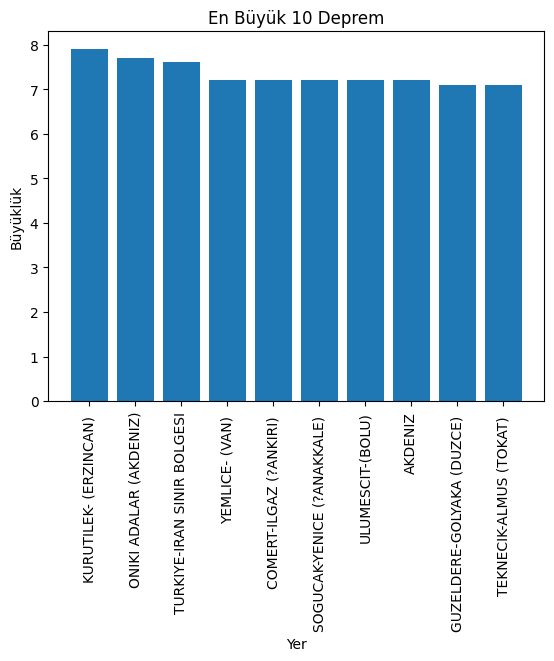

In [46]:
# verileri büyüklüğüne göre sıralayalım:
df_sorted = df.sort_values(by='xM', ascending=False)

# en büyük 10 depremi seçelim:
top10 = df_sorted.head(10)

plt.bar(top10['Yer'], top10['xM'])

plt.title('En Büyük 10 Deprem')
plt.xlabel('Yer')
plt.ylabel('Büyüklük')

plt.xticks(rotation=90)

plt.show()

In [47]:
import folium

start_coords = [39.9334, 32.8597]
start_zoom = 6

m = folium.Map(location=start_coords, zoom_start=start_zoom)

for i, row in df.nlargest(10, 'xM').iterrows():
    location = [row['Enlem'], row['Boylam']]
    marker = folium.Marker(location=location, tooltip=row['xM'])
    popup = folium.Popup(f"{row['Olus tarihi']} - {row['xM']}")
    marker.add_child(popup)
    marker.add_to(m)

m

In [48]:
print("Depremlerin şiddetleri: ")
print(df['xM'].describe()) #Depremlerin şiddetlerinin istatistiksel özetlerini verir. 

Depremlerin şiddetleri: 
count    4645.000000
mean        4.354230
std         0.687007
min         3.500000
25%         3.800000
50%         4.200000
75%         4.800000
max         7.900000
Name: xM, dtype: float64


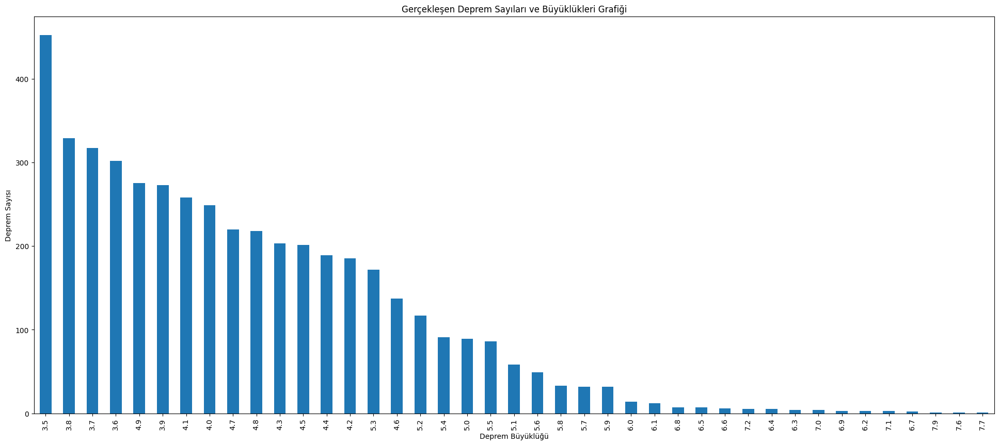

In [49]:
df["xM"].value_counts().plot(kind='bar', figsize=(24,10)) #bar grafiği 

plt.title("Gerçekleşen Deprem Sayıları ve Büyüklükleri Grafiği") #grafik başlığı
plt.xlabel("Deprem Büyüklüğü") #x ekseni etiketi
plt.ylabel("Deprem Sayısı") #y ekseni etiketi

plt.show()


Bu grafiğe göre depremlerin çoğu 3.5 - 6.0 arasında. Ayrıca büyüklük arttıkça deprem sayısının azalmakta.


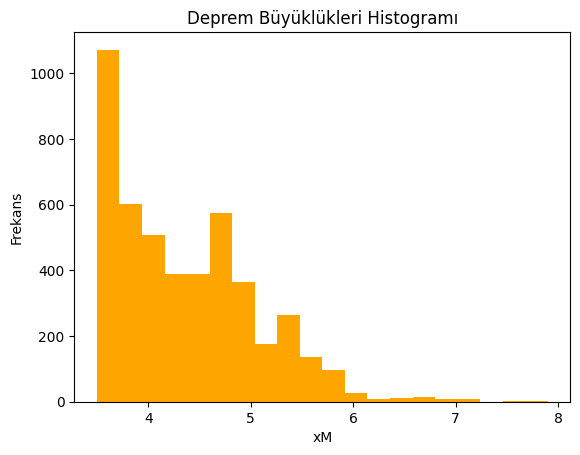

In [51]:
plt.hist(df['xM'], bins=20, color="orange") #histogram grafiği

plt.xlabel('xM')
plt.ylabel('Frekans')
plt.title('Deprem Büyüklükleri Histogramı')

plt.show()


Üstteki grafik gerçekleşen her depremin büyüklüklerinde kaç tane deprem olduğunu gösterirken alttaki belirli bir büyüklük aralığındaki deprem sayısını ifade ettiğinden
inceleme kolaylığı sağladı.
Bu grafiğe göre depremler genelde 3.5 - 6.0 aralığında yoğunlaşmış durumda.


In [23]:
#df'den günlük, aylık ve yıllık değerleri çıkarılım:
df['gun'] = df['Olus tarihi'].dt.day
df['ay'] = df['Olus tarihi'].dt.month
df['yil'] = df['Olus tarihi'].dt.year

#Olus tarihi ne göre gruplayalım:
yillikdepremsayisi=df.groupby(df['Olus tarihi'].dt.year).size().reset_index(name='Deprem Sayısı')
print(yillikdepremsayisi)

     Olus tarihi  Deprem Sayısı
0           1915              6
1           1916              5
2           1917              8
3           1918             14
4           1919             12
..           ...            ...
102         2017            607
103         2018            225
104         2019            370
105         2020            934
106         2021              1

[107 rows x 2 columns]


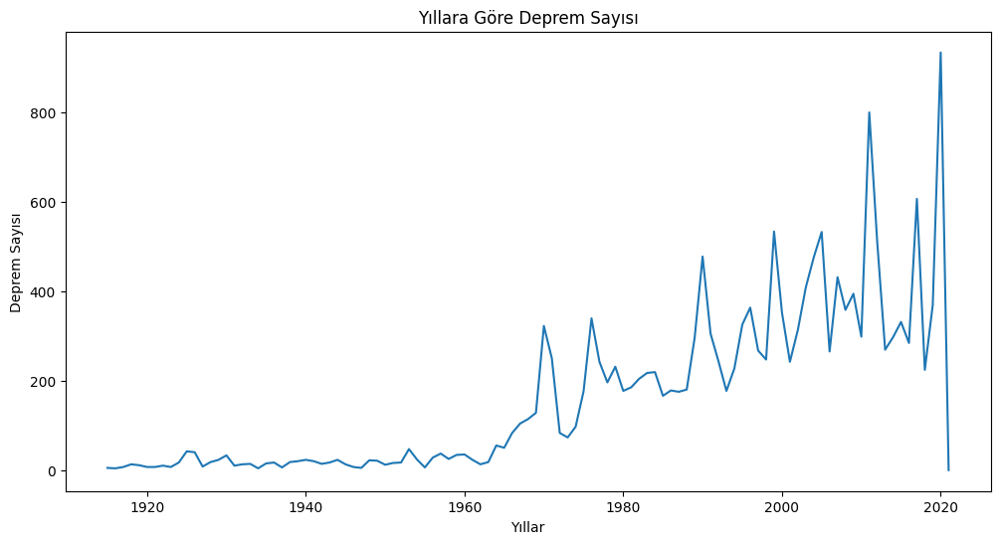

In [22]:
yillik_deprem = df.groupby(df['Olus tarihi'].dt.year).size().reset_index(name='Deprem Sayısı')

plt.figure(figsize=(12, 6))
sns.lineplot(x='Olus tarihi', y='Deprem Sayısı', data=yillik_deprem)
plt.title('Yıllara Göre Deprem Sayısı')
plt.xlabel('Yıllar')
plt.ylabel('Deprem Sayısı')

plt.show()

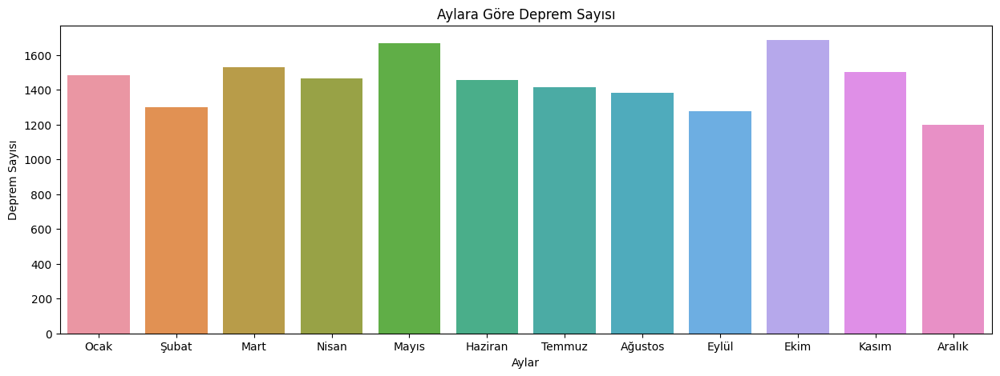

In [45]:
# Türkçe ay isimleri sözlüğü oluşturalım:
ay_sozluk = {1:'Ocak', 2:'Şubat', 3:'Mart', 4:'Nisan', 5:'Mayıs', 6:'Haziran', 
             7:'Temmuz', 8:'Ağustos', 9:'Eylül', 10:'Ekim', 11:'Kasım', 12:'Aralık'}

# Aylık deprem sayısını hesaplayalım:
aylikdepremsayisi = df.groupby(df['Olus tarihi'].dt.month).size().reset_index(name='Deprem Sayısı')
aylikdepremsayisi['Ay'] = aylikdepremsayisi['Olus tarihi'].map(ay_sozluk)

# Ayları sıraya koyalım:
aylikdepremsayisi = aylikdepremsayisi.sort_values('Olus tarihi')

# Grafiği oluşturalım:
plt.figure(figsize=(15,5))
sns.barplot(x='Ay', y='Deprem Sayısı', data=aylikdepremsayisi, order=list(ay_sozluk.values()))
plt.title("Aylara Göre Deprem Sayısı")
plt.xlabel("Aylar")
plt.ylabel("Deprem Sayısı")

plt.show()

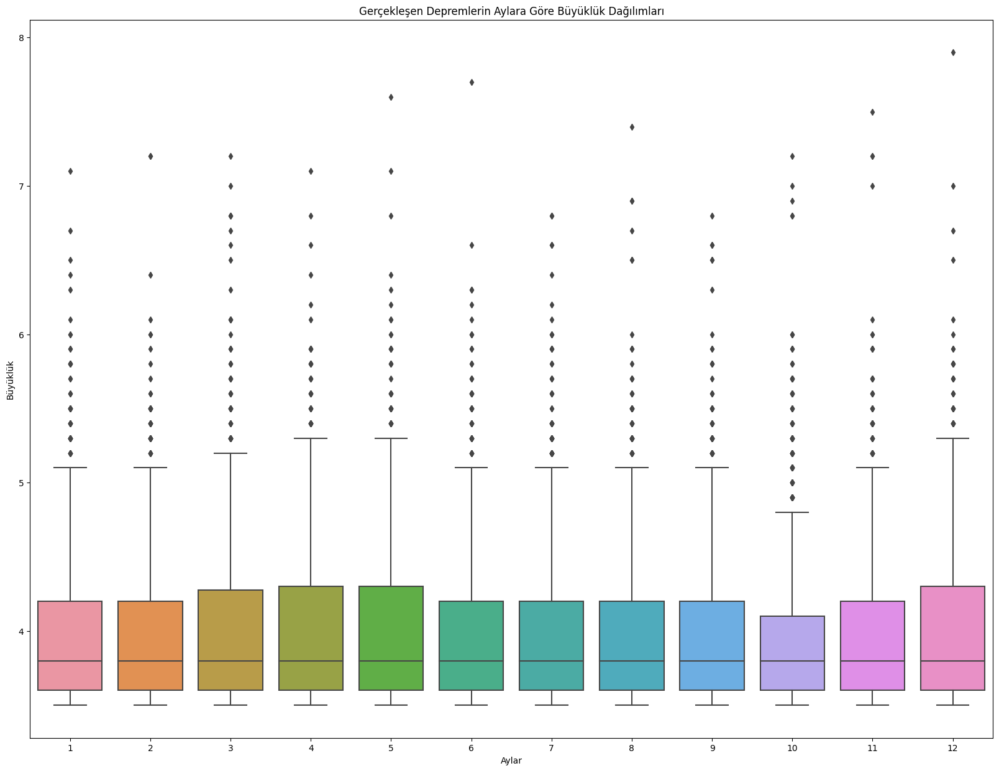

In [54]:
df["ay"] = pd.DatetimeIndex(df["Olus tarihi"]).month

plt.figure(figsize=(20, 15))
sns.boxplot(x="ay",y="xM",data=df)
plt.title("Gerçekleşen Depremlerin Aylara Göre Büyüklük Dağılımları")
plt.xlabel('Aylar')
plt.ylabel('Büyüklük')

plt.show()

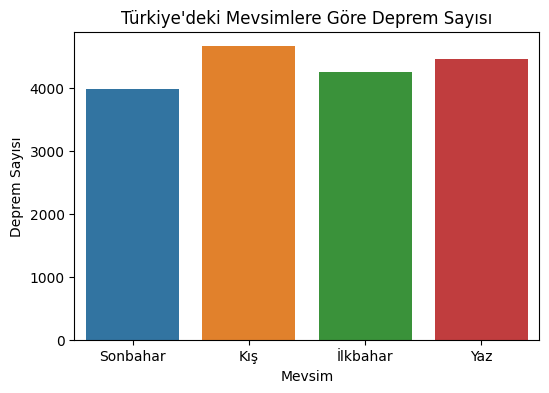

In [52]:
seasonal = df['Olus tarihi'].dt.month.apply(lambda x: ((x%12 + 3)//3)).value_counts().sort_index()
seasonal.index = ['Sonbahar', 'Kış', 'İlkbahar', 'Yaz']

plt.figure(figsize=(6, 4))
sns.barplot(x=seasonal.index, y=seasonal.values)
plt.xlabel('Mevsim')
plt.ylabel('Deprem Sayısı')
plt.title('Türkiye\'deki Mevsimlere Göre Deprem Sayısı')

plt.show()

In [25]:
print("Depremlerin derinlikleri: ")
print(df['Derinlik'].describe()) #Depremlerin derinliklerinin istatistiksel özetlerini verir.

Depremlerin derinlikleri: 
count    4645.000000
mean       20.413305
std        24.485768
min         1.000000
25%         5.500000
50%        10.000000
75%        28.000000
max       199.000000
Name: Derinlik, dtype: float64


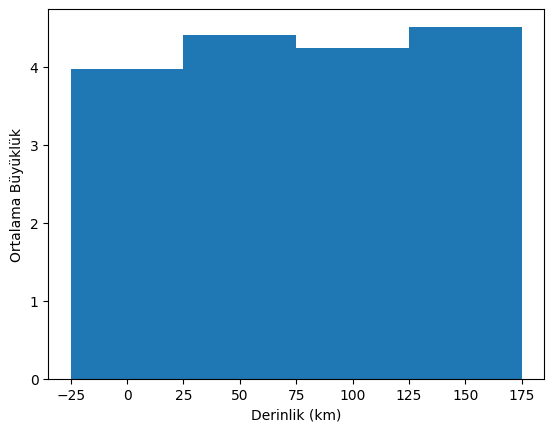

In [15]:
# Derinliğe göre deprem büyüklüklerini hesaplayalım:
bins = np.arange(0, 701, 50)  # 0-700 aralığındaki her 50 m için bir bölme oluşturalım:
depth_groups = df.groupby(pd.cut(df['Derinlik'], bins=bins))
mean_magnitude = depth_groups['xM'].mean() #her gruptaki ortalama deprem büyüklüğünü hesaplar.

plt.bar(bins[:-1], mean_magnitude.values, width=50)
plt.xlabel('Derinlik (km)')
plt.ylabel('Ortalama Büyüklük')
plt.show()

Bu grafikten, derinlik arttıkça deprem büyüklüğünün arttığını rahatlıkla görmek mümkündür.

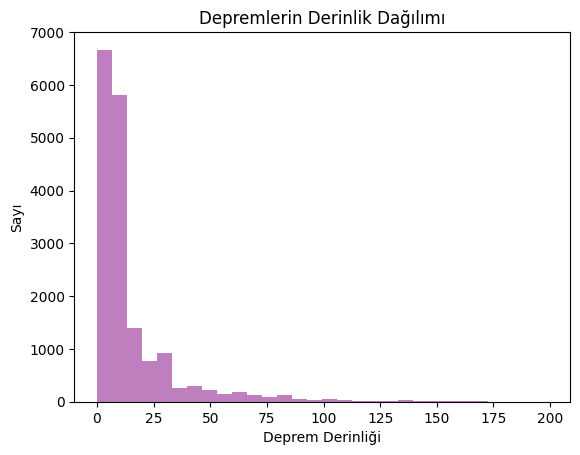

In [16]:
# Derinliklere göre gruplama yaparak her derinlikte kaç adet deprem olduğunu hesaplayalım
depth_counts = df.groupby('Derinlik')['xM'].count()

# Histogram grafiği ile derinlik dağılımını görselleştirelim
plt.hist(df['Derinlik'], bins=30, alpha=0.5, color='purple')
plt.xlabel('Deprem Derinliği')
plt.ylabel('Sayı')
plt.title('Depremlerin Derinlik Dağılımı')
plt.show()

Grafikte gözlemlenen sıklık, x eksenindeki derinlik arttıkça azalmaktadır. Bu da veri setindeki depremlerin genellikle daha sığ derinliklerde gerçekleştiğini göstermektedir.

In [53]:
import folium

map = folium.Map(location=[38.963745, 35.243320], zoom_start=6)
#location:haritanın başlangıç koordinatları, zoom_start: başlangıç yakınlaştırma seviyesi
#Veri setindeki her bir satır üzerinde dönen bir döngü oluşturalım:
for i, row in df.iterrows():
    #her bir depremin konumunu folium.CircleMarker fonksiyonunu kullanarak bir daire olarak haritaya ekleyelim:
    folium.CircleMarker(location=[row['Enlem'], row['Boylam']], radius=3, color='red', fill=True, fill_opacity=0.5).add_to(map)
    #location: dairenin konumu, radius: dairenin yarıçapı, color: dairenin kenar rengi, fill: dairenin içi boyansın mı?, fill_opacity: doldurma renginin şeffaflık seviyesi
map

In [55]:
from folium.plugins import MarkerCluster
"""
MarkerCluster, haritada birçok nokta göstermek istediğimizde, bunları kümeleyerek daha düzenli bir görünüm sağlamamıza olanak tanır. 
Bu kümelere tıkladığımızda, kümedeki tüm noktaların bir popup penceresinde görüntülenmesini sağlar.
"""
# Folium ile haritayı oluşturalım:
map = folium.Map(location=[38.963745, 35.243320], zoom_start=6)

#Marker cluster oluşturalım:
mc = MarkerCluster()
#MarkerCluster, aynı bölgedeki çok sayıda marker'ın bir araya getirilerek gruplanmasını sağlar ve haritayı daha okunaklı hale getirir.
for i, row in df.iterrows():
    location = [row['Enlem'], row['Boylam']]
    marker = folium.Marker(location=location, tooltip=row['xM'])
    popup = folium.Popup(f"{row['Olus tarihi']} - {row['xM']}") 
    popup.add_to(marker)
    marker.add_to(mc)
#MarkerClusterları haritaya ekleyelim:
map.add_child(mc)
#tam ekranda göstersin.
folium.plugins.Fullscreen().add_to(map)
map

In [60]:
# Her bir deprem kaydını Olus tarihi sütununa göre 10 yıllık gruplara ayıralım
df['year_group'] = (df['Olus tarihi'].dt.year // 10) * 10

year_groups = sorted(df['year_group'].unique())
year_groups.sort()

# Her bir yıl grubu için ayrı bir harita oluşturalım
for year_group in year_groups:
    # Yıl grubundaki depremleri seçelim
    group_df = df[df['year_group'] == year_group]   
    
    # Yeni bir harita oluşturalım
    map = folium.Map(location=[38.963745, 35.243320], zoom_start=5)

    # Marker Cluster'lar için yeni bir grup oluşturalım
    marker_cluster = MarkerCluster().add_to(map)

    # Marker Cluster'lar için iterasyon yapalım
    for i, row in group_df.iterrows():
        location = [row['Enlem'], row['Boylam']]
        marker = folium.Marker(location=location, tooltip=row['xM'])
        popup = folium.Popup(f"{row['Olus tarihi']} - {row['xM']}")

        # Popup ve Marker'ı MarkerCluster'a ekleyelim:
        popup.add_to(marker)
        marker.add_to(marker_cluster)
        
    # Haritayı kaydedelim
    map.save(f"map_{year_group}-{year_group+10}.html")

In [57]:
# 6.5 ve üzeri büyüklükteki depremleri içeren bir dataframe oluşturalım
df_large_eq = df[df['xM'] >= 6.5]

# Folium harita nesnesi oluşturalım ve haritayı konumlandıralım
map_large_eq = folium.Map(location=[38.963745, 35.243320], zoom_start=6)

# Büyüklüğü 7 ve üzeri olan depremleri haritada göstermek için bir MarkerCluster oluşturalım
marker_cluster = MarkerCluster().add_to(map_large_eq)

# MarkerCluster'a her deprem için bir Marker ve Popup ekleyelim
for i, row in df_large_eq.iterrows():
    location = [row['Enlem'], row['Boylam']]
    marker = folium.Marker(location=location, tooltip=row['xM'], icon=folium.Icon(color='red', icon='info-sign'))
    popup = folium.Popup(f"{row['Olus tarihi']} - {row['xM']}")

    # Popup ve Marker'ı MarkerCluster'a ekleyelim:
    popup.add_to(marker)
    marker.add_to(marker_cluster)

# Haritayı gösterelim
map_large_eq

In [63]:
from folium.plugins import HeatMap
from sklearn.linear_model import LinearRegression

# Enlem ve Boylam verilerini kullanarak bir Konum değişkeni elde edelim:
df['Konum'] = df['Enlem'].astype(str) + ',' + df['Boylam'].astype(str)

# Bağımsız değişken: Konum değişkeni olsun.
X = pd.get_dummies(df['Konum'], drop_first=True, prefix=['Enlem', 'Boylam'])

# features adında bir liste oluşturalım:
features = ['Enlem_' + col.split('_')[-1] if 'Enlem' in col else 'Boylam_' + col.split('_')[-1] for col in X.columns]

# Oluşturduğumuz features listesini X sütun isimleri olarak atayalım:
X.columns = features

# Bağımlı değişken: Büyüklük (xM) olsun.
y = df['xM']

# Çoklu doğrusal regresyon modelini oluşturalım:
model = LinearRegression()

# Modeli eğitelim:
model.fit(X.values, y.values)

locations = []
# her bir koordinatın "xM" tahmini hesaplayalım:
for index, row in X.iterrows():
    lat, lon = df.loc[index, 'Enlem'], df.loc[index, 'Boylam']
    locations.append((float(lat), float(lon), model.predict([row])[0]))

locations_df = pd.DataFrame(locations, columns=['lat', 'lon', 'predicted_xM'])

# Harita oluşturalım:
m = folium.Map(location=[38.9637, 35.2433], zoom_start=5)

# Risk haritasını oluşturalım:
HeatMap(locations_df[['lat', 'lon', 'predicted_xM']], name='Risk Map', control=False).add_to(m)

# Harita kontrollerini ekleyelim:
folium.LayerControl().add_to(m)

# Haritayı kaydedelim:
m.save('earthquake_risk_map.html')
